The book is a concerted effort of team members in "floes" project.

In [102]:
# import packages:
import numpy as np                   # Numeric Python
import matplotlib.pyplot as plt      # Plotting routines
import h5py                          # general HDF5 reading/writing library
import rioxarray as rx               # Package to read raster data from hdf5 files
from pyproj import Transformer, CRS  # libraries to allow coordinate transforms
import glob                          # Package to locate files on disk
import os                            # File-level utilities
import re                            # regular expressions for string interpretation
import icepyx as ipx                 # Package to interact with ICESat-2 online resources
from sliderule import icesat2        # Package for online ICESat-2 processing
import xarray as xr
import cartopy.crs as ccrs
import ipyleaflet
from ipyleaflet import Map, GeoData, LayersControl,Rectangle, basemaps, basemap_to_tiles, TileLayer, SplitMapControl, Polygon, Marker
import pandas as pd

In [103]:
#Please note: This tutorial is best run in interactive mode,
# but is archived with the interactive section disabled.
# To enable interactive mode, comment the next line, and uncomment the second line:
%matplotlib inline  
#%matplotlib widget 
%config InlineBackend.figure_format = 'retina'

Define the region based on several criteria such as episodes like cyclones, overlap area of ICESat-2 and Sentinel 1/2

In [104]:
# Show image of area of interest 
# for example, Amery Ice Shelf: https://www.antarctica.gov.au/news/2021/explosive-cyclones-off-antarctica-contribute-to-ice-shelf-calving/
center = [-69.45,71] 
zoom = 5
polygon = Polygon(
    locations=[(-69.45, 70), (-67.45, 70), (-67.45, 72), (-69.45, 72)],
    color="red",
    fill_color="red"
)

m = Map(basemap=basemap_to_tiles(basemaps.NASAGIBS.ModisAquaTrueColorCR, '2019-09-23'),center=center,zoom=zoom)
m.add_control(LayersControl())
m.add_layer(Marker(location=center)) 
m.add_layer(polygon)
m

Map(center=[-69.45, 71], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out…

A major rift moving in the direction of ice flow on the Amery Ice Shelf, with radial rifts extending west (T1) and east (T2) from the main rift. After two explosive twin cyclone events on the 19th and 21–24 September 2019, wind and wave action caused the T1 rift to expand, leading to the calving of iceberg D28 from the shelf front on 25 September – the largest local calving event since the early 1960s. 

References:
Francis, D., Mattingly, K. S., Lhermitte, S., Temimi, M., and Heil, P.: Atmospheric extremes caused high oceanward sea surface slope triggering the biggest calving event in more than 50 years at the Amery Ice Shelf, The Cryosphere, 15, 2147–2165, https://doi.org/10.5194/tc-15-2147-2021, 2021.

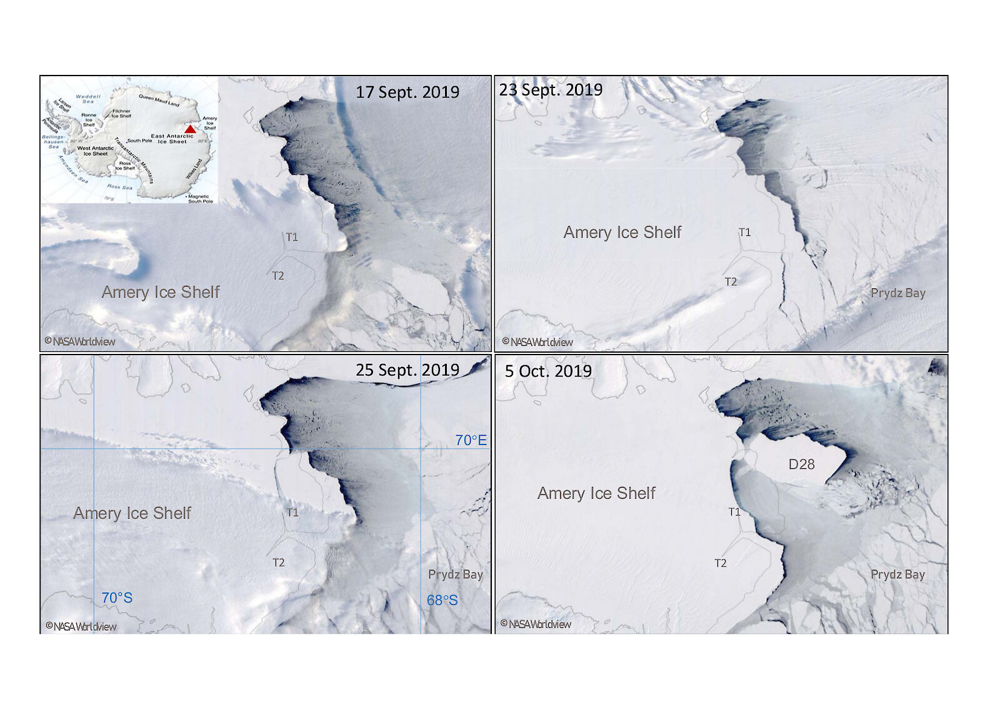

ATL07 Sea Ice Height anlysis

In [105]:
# Specifying the necessary icepyx parameters
short_name = 'ATL07'
spatial_extent = [70, -69.45, 72, -67.45] # minlon, minlat, maxlon, maxlat
date_range = ['2019-09-10','2019-10-10']

In [106]:
# Find all avariable granules
region = ipx.Query(short_name, spatial_extent, date_range) 
#region.product_summary_info()

/srv/conda/envs/notebook/lib/python3.9/site-packages/panel/io/resources.py:44: DeprecationWarning: 'jinja2.Markup' is deprecated and will be removed in Jinja 3.1. Import 'markupsafe.Markup' instead.
  _env.filters['json'] = lambda obj: Markup(json.dumps(obj))
/srv/conda/envs/notebook/lib/python3.9/site-packages/panel/io/resources.py:44: DeprecationWarning: 'jinja2.Markup' is deprecated and will be removed in Jinja 3.1. Import 'markupsafe.Markup' instead.
  _env.filters['json'] = lambda obj: Markup(json.dumps(obj))
/srv/conda/envs/notebook/lib/python3.9/site-packages/panel/io/resources.py:44: DeprecationWarning: 'jinja2.Markup' is deprecated and will be removed in Jinja 3.1. Import 'markupsafe.Markup' instead.
  _env.filters['json'] = lambda obj: Markup(json.dumps(obj))
/srv/conda/envs/notebook/lib/python3.9/site-packages/panel/io/resources.py:44: DeprecationWarning: 'jinja2.Markup' is deprecated and will be removed in Jinja 3.1. Import 'markupsafe.Markup' instead.
  _env.filters['json'

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
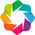

:Overlay
   .WMTS.I :WMTS   [Longitude,Latitude]
   .Path.I :Path   [Longitude,Latitude]

In [107]:
region.visualize_spatial_extent()

In [108]:
# Show the available granules
region.avail_granules(ids=True)

[['ATL07-02_20190912052401_11630401_005_01.h5',
  'ATL07-02_20190912175820_11710401_005_01.h5',
  'ATL07-02_20190916051542_12240401_005_01.h5',
  'ATL07-02_20190916175001_12320401_005_01.h5',
  'ATL07-02_20190920050723_12850401_005_01.h5',
  'ATL07-02_20190924045905_13460401_005_01.h5',
  'ATL07-02_20190928045046_00200501_005_01.h5',
  'ATL07-02_20191003165106_01040501_005_01.h5',
  'ATL07-02_20191007164246_01650501_005_01.h5']]

Avaiaible granules are:

'ATL07-02_20190912052401_11630401_005_01.h5' --- No Data <br>
'ATL07-02_20190912175820_11710401_005_01.h5' --- Yes <br>
'ATL07-02_20190916051542_12240401_005_01.h5' --- No data <br>
'ATL07-02_20190916175001_12320401_005_01.h5' --- Yes <br>
'ATL07-02_20190920050723_12850401_005_01.h5' --- Map data not yet avaiable <br>
'ATL07-02_20190924045905_13460401_005_01.h5' --- Yes <br>
'ATL07-02_20190928045046_00200501_005_01.h5' --- No data <br>
'ATL07-02_20191003165106_01040501_005_01.h5' --- No data <br>
'ATL07-02_20191007164246_01650501_005_01.h5' --- Yes <br>

Naming convention for ATL07 files: Instead of 14 regions, there are only 2: Northern Hemisphere (01), and Southern Hemisphere (02). For Northern Hemisphere products look for files that start with 'ATL07-01'

'ATL07-[HH] [yyyymmdd][hhmmss] [ttttccss]_[vvv_rr].h5'

tttt is the reference ground track


In [109]:
cyclemap, rgtmap = region.visualize_elevation()
rgtmap

Generating urls
Sending request to OpenAltimetry, please wait...


100%|██████████| 3/3 [00:01<00:00,  1.83it/s]


Plot elevation, please wait...


:Layout
   .DynamicMap.I  :DynamicMap   [rgt]
      :Overlay
         .Tiles.I :Tiles   [x,y]
         .Image.I :Image   [x,y]   (x_y elevation)
   .DynamicMap.II :DynamicMap   [rgt]
      :Image   [lat,elevation]   (lat_elevation elevation)

In [110]:
# After checking, only four RGT tracks are avaiable as below
rgts_20190912 = ['1171']
rgts_20190916 = ['1232']
rgts_20190924 = ['1346']
rgts_20191007 = ['0165']

In [111]:
# Use for loop to download the data
rgts = [rgts_20190912, rgts_20190916,rgts_20190924, rgts_20191007]
regions = []
for rgt in rgts:
    regions.append(ipx.Query(short_name, spatial_extent, date_range, tracks=rgt))

In [112]:
# Set Earthdata credentials
uid = 'uwhackweek'
email = 'hackweekadmin@gmail.com'
path = '/home/jovyan/floes/contributors/xueke/data/'

# Order the granules and Download the data
#for region in regions:
#    region.earthdata_login(uid, email)
#    region.order_granules()
#    region.download_granules(path)

In [113]:
# Load the ICESat-2 data. We will just look at the central beams (GT2R/L)
beam_r = 'gt2r'
beam_l = 'gt2l'

def read_into_df(filepath):
    with h5py.File(filepath, 'r') as f:
        # read the height values, identify invalid heights, and set them to NaN
        temp_gt2r=np.array(f[beam_r+'/sea_ice_segments/heights/height_segment_height'][:])
        temp_gt2l=np.array(f[beam_l+'/sea_ice_segments/heights/height_segment_height'][:])
        temp_gt2r[temp_gt2r==f[beam_r+'/sea_ice_segments/heights/height_segment_height'].attrs['_FillValue']]=np.NaN
        temp_gt2l[temp_gt2l==f[beam_l+'/sea_ice_segments/heights/height_segment_height'].attrs['_FillValue']]=np.NaN

        is2_gt2r = pd.DataFrame(data={'lat': f[beam_r+'/sea_ice_segments/latitude'][:],
                                      'lon': f[beam_r+'/sea_ice_segments/longitude'][:],
                                      'height': temp_gt2r})
        is2_gt2l = pd.DataFrame(data={'lat': f[beam_l+'/sea_ice_segments/latitude'][:],
                                      'lon': f[beam_l+'/sea_ice_segments/longitude'][:],
                                      'height': temp_gt2l})
    return is2_gt2r

In [114]:
file_20190912 = path + 'processed_ATL07-02_20190912175820_11710401_005_01.h5'
file_20190916 = path + 'processed_ATL07-02_20190916175001_12320401_005_01.h5'
file_20190924 = path + 'processed_ATL07-02_20190924045905_13460401_005_01.h5'
file_20191007 = path + 'processed_ATL07-02_20191007164246_01650501_005_01.h5'

is2_gt2r_20190912 = read_into_df(file_20190912)
is2_gt2r_20190916 = read_into_df(file_20190916)
is2_gt2r_20190924 = read_into_df(file_20190924)
is2_gt2r_20191007 = read_into_df(file_20191007)

In [115]:
print(np.nanmax(is2_gt2r_20190912['height']))
print(np.nanmin(is2_gt2r_20190912['height']))

0.73406386
-0.23959957


Map the region

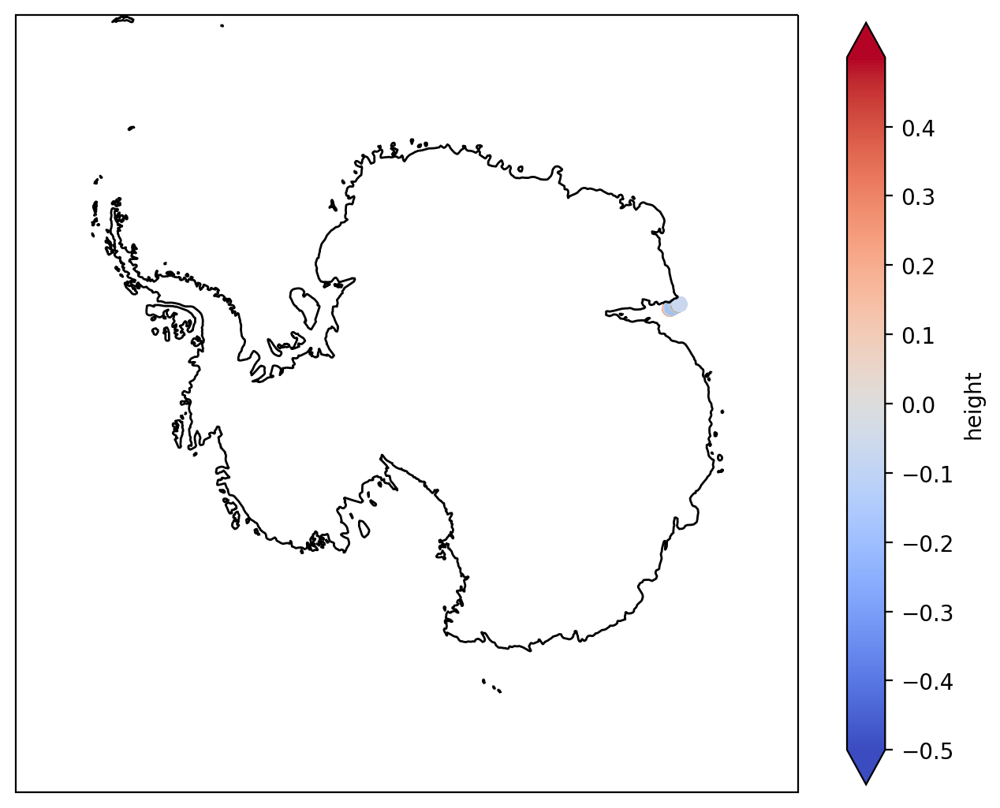

In [116]:
vmin=-0.5
vmax=0.5
ticks=np.arange(vmin,vmax,0.1)
is2_gt2r = is2_gt2r_20190912

plt.figure(figsize=(8,8), dpi= 100)
ax = plt.axes(projection=ccrs.SouthPolarStereo(central_longitude=0)) # choose polar sterographic for projection
ax.coastlines(resolution='50m', color='black', linewidth=1)
ax.set_extent([-180,180,-90,-60], ccrs.PlateCarree())  # minlon, minlat, maxlon, maxlat
plt.scatter(is2_gt2r['lon'][:], is2_gt2r['lat'][:],c=is2_gt2r['height'][:], cmap=plt.cm.get_cmap('coolwarm'), vmin=vmin,vmax=vmax,transform=ccrs.PlateCarree())
plt.colorbar(label='height', shrink=0.8, ticks=ticks,extend='both');

Plots showing how surface height changes before and after the two cyclone events on the 19th and 21–24 September 2019.

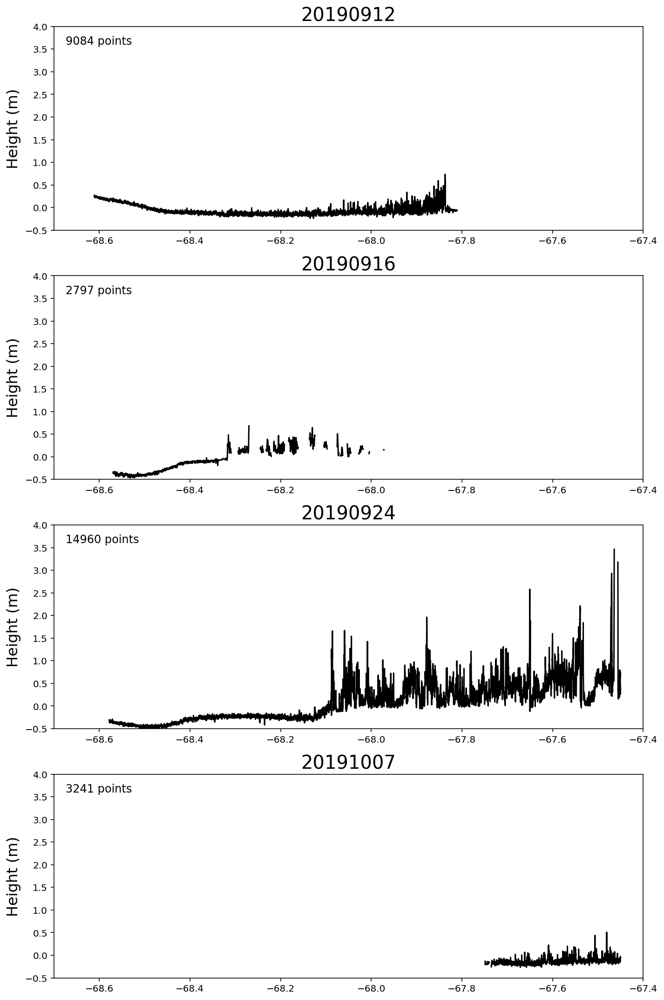

In [117]:
### Thanks to Heather for the defination of plots ###
def plot_line_and_label(axn,dpanda,xvar,yvar):
    date = ["20190912","20190916","20190924","20191007"]
    if xvar is None:
        xplot = np.arange(0,len(dpanda[yvar]))
    else:
        xplot = dpanda[xvar]
    ax[axn].plot(xplot,dpanda[yvar], color="k")
#    ax[axn].set_xlabel('Lat', fontsize=16)
    ax[axn].set_ylabel('Height (m)', fontsize=16)
    ax[axn].set_title(date[axn], fontsize=20)
    ax[axn].set_xlim([-68.7, -67.4])
    ax[axn].set_ylim([-0.5, 4])
    ax[axn].text(0.02, 0.90, str(len(dpanda[yvar]))+' points', size=12, horizontalalignment='left',verticalalignment='bottom',transform=ax[axn].transAxes)
    fig.tight_layout()
    return

fig,ax = plt.subplots(4,figsize=(10,15))
plot_line_and_label(0, is2_gt2r_20190912,'lat','height')
plot_line_and_label(1, is2_gt2r_20190916,'lat','height')
plot_line_and_label(2, is2_gt2r_20190924,'lat','height')
plot_line_and_label(3, is2_gt2r_20191007,'lat','height')